Need to check the orbit compatibility for GRACE-FO and ICESat-2 to see if the GRACE densities can used as approximate checks for accuracy along the ICESat-2 orbit. 

In [1]:
import pandas as pd
import numpy  as np

Import the GRACE-FO data as a csv

In [2]:
path_gfo     = "/data/SatDragModelValidation/data/inputs/raw_inputdata/data_GRACEFO/"
filename_gfo = 'GC_DNS_ACC_2018_11_v02.txt'

datapath_gfo     = path_gfo + filename_gfo

headers = [
    'date',        #         Date (yyyy-mm-dd)
    'time',        #         Time (hh:mm:ss.sss)
    'time_system', #         Time system: UTC or GPS (differs per mission)
    'alt',         #  f10.3  Altitude (m), GRS80
    'lon',         #   f8.3  Geodetic longitude (deg), GRS80
    'lat',         #   f7.3  Geodetic latitude (deg), GRS80
    'lst',         #   f6.3  Local solar time (h)
    'arglat',      #   f7.3  Argument of latitude (deg)
    'dens_x',      #  e15.8  Density derived from accelerometer measurements (kg/m3)
    'dens_mean',   #  e15.8  Running orbit average of density (kg/m3)
    'flag_den',        #   f4.1  Flag for density: 0 = nominal data, 1 = anomalous data (-)
    'flag_orbitavg',        #   f4.1  Flag for running orbit average density: 0 = nominal data, 1 = anomalous data (-)
            ]


gracefo_raw = pd.read_csv(datapath_gfo, 
        skiprows = 38, 
        sep = '\s+',
        names = headers,
                   )

date = pd.to_datetime(\
                    + gracefo_raw['date']  \
                    + gracefo_raw['time'], \
                            format='%Y-%m-%d%H:%M:%S.000')

gracefo_raw.insert(0, 'Date', date)

del gracefo_raw['date'], gracefo_raw['time'], date

Import ICESat-2 

In [3]:
path_icesat     = "/data/SatDragModelValidation/data/outputs_clean/icesat2/Paper2023_icesat2_assessment/results_fixedCD/"
filename_icesat = '20181109000200_20181123000000__24hrArcs__FixedCD2.5__msis2.csv'
datapath_icesat     = path_icesat + filename_icesat


headers = [
    'date',     # (UTC)
    'time',     # (UTC)
    'Lon',      # (deg)
    'Lat',      # (deg)
    'Alt',      # (m)
    'Rho',      # (kg/m^3)
    'T_PSO',    # (m)
    'T_OrbFit', # (m)
            ]


icesat2 = pd.read_csv(datapath_icesat, 
        skiprows = 16, 
        sep = '\s+',
        names = headers,
                   )

date = pd.to_datetime(\
                    + icesat2['date']  \
                    + icesat2['time'], \
                            format='%Y-%m-%d%H:%M:%S')

icesat2.insert(0, 'Date', date)

del icesat2['date'], icesat2['time'], date
del icesat2['T_PSO'], icesat2['T_OrbFit']

In [4]:
# Calculate local solar time 

calc_lst = np.mod(icesat2['Lon']/15 + icesat2['Date'].dt.hour, 24)
# lst  = np.sort(calc_lst)
# ilst = np.argsort(calc_lst)


In [5]:
gracefo = gracefo_raw.query(f"{icesat2['Date'].iloc[0].year}"     \
                             +f"{icesat2['Date'].iloc[0].month:02d}"\
                             +f"{icesat2['Date'].iloc[0].day:02d}"  \
                             +f" < Date < "\
                             +f"{icesat2['Date'].iloc[-1].year}"     \
                             +f"{icesat2['Date'].iloc[-1].month:02d}"\
                             +f"{icesat2['Date'].iloc[-1].day+1:02d}")



In [6]:
from pygeodyn.pygeodyn_plot import *

In [7]:
gracefo['Date']

69121    2018-11-09 00:00:10
69122    2018-11-09 00:00:20
69123    2018-11-09 00:00:30
69124    2018-11-09 00:00:40
69125    2018-11-09 00:00:50
                 ...        
198715   2018-11-23 23:59:10
198716   2018-11-23 23:59:20
198717   2018-11-23 23:59:30
198718   2018-11-23 23:59:40
198719   2018-11-23 23:59:50
Name: Date, Length: 129599, dtype: datetime64[ns]

In [8]:

fig = make_subplots(rows=1, cols=1)


fig.add_trace(
    go.Scattergl(x=calc_lst,
                 y=icesat2['Lat'],
                 name='ICESat2',
                 mode='markers',
                 opacity=1,
                 marker=dict( size=3 ),
                 showlegend=True),
    secondary_y=False,
    row=1, col=1)


fig.add_trace(
    go.Scattergl(x=gracefo['lst'],
                 y=gracefo['lat'],
                 name='GRACE-FO',
                 mode='markers',
                 opacity=1,
                 marker=dict( size=3 ),
                 showlegend=True),
    secondary_y=False,
    row=1, col=1)



fig.update_xaxes(title="Local solar time (h)", row=1, col=1)
fig.update_yaxes(title="Geodetic Latitude (deg), GRS80", row=1, col=1)
fig.update_layout(autosize=True,
                  legend= {'itemsizing': 'constant'},
                 )

fig.show(config=config)



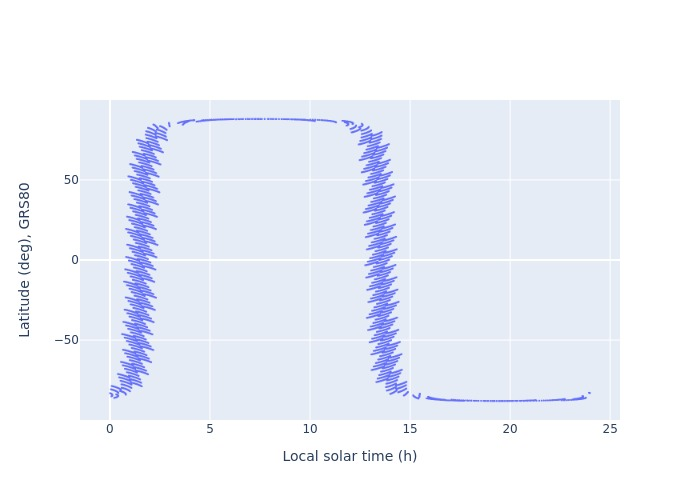

In [9]:

fig = make_subplots(rows=1, cols=1)

fig.add_trace(
    go.Scattergl(x=calc_lst,
                 y=icesat2['Lat'],
                 mode='markers',
                 opacity=1,
                 marker=dict( size=2 ),
#                line = dict(shape = 'hv',dash='solid', color = 'black', width=3),
                 showlegend=False),
    secondary_y=False,
    row=1, col=1)

fig.update_xaxes(title="Local solar time (h)", row=1, col=1)
fig.update_yaxes(title="Latitude (deg), GRS80", row=1, col=1)

fig.show(renderer="jpg",config=config)

